# Should change Tkf below

In [1]:
import importlib
import time
import os
import pickle
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy import ndimage
from scipy import integrate
from scipy import interpolate

# Should change Tkf below

In [2]:
from multi_loc import covariance, assimilate, utilities

In [3]:
%matplotlib inline

In [4]:
def imshow(X, title=None, vmin=None, vmax=None, cmap=None):
    plt.figure()
    im = plt.imshow(X, vmin=vmin, vmax=vmax, cmap=cmap)
    plt.colorbar(im)
    plt.title(title)

In [5]:
tune_name = 'fine_obs_R'

save_dir = 'fine_time'

home = os.path.expanduser('~')
save_dir = os.path.join(
    home,
    'Documents/python_code/multi_loc/notebooks/',
    save_dir)
    
this_path = os.path.join(save_dir, 'Z_GT.npy')
Zgt = np.load(this_path)

# this_path = os.path.join(save_dir, 'Z0_ens.npy')
# Z0ens = np.load(this_path)

this_path = os.path.join(save_dir, 't_gt.npy')
t_gt = np.load(this_path)


this_path = os.path.join(save_dir, 'run_vars.pkl')
with open(this_path, mode='rb') as f:
    run_vars = pickle.load(f)

In [6]:
for key, value in run_vars.items():
    print(key + ' = ' + str(value))
    exec(key + '=value')

Nz = 960
K = 32
I = 12
F = 15.0
b = 10.0
c = 2.5
alpha = 0.12414383561643835
beta = 0.013746194824961947
coarse = 8
Nez = 20
Nex = 500
dt_gt = 0.000625
Tgt = 25.0


In [122]:
Nez = 100
Nex = 1

In [123]:
Z_lr = np.load('/Users/harty/Documents/python_code/multi_loc/notebooks/RK_tune/Z_long_run.npy')
X0ens, Z0ens = utilities.generate_X_Z_LM3_ens(
    Z_lr, Nex, Nez, coarse, I, alpha, beta)
del Z_lr

# Should change Tkf below

In [281]:
tune_dir = os.path.join(save_dir, tune_name)
if not os.path.exists(tune_dir):
    os.mkdir(tune_dir)

# dt_trial_rk = 0.005/8
# dt_kf = 0.005
dt_trial_rk = 0.05/24
dt_kf = 0.05
dt_save = None
Tkf = Tgt/4     ######## Change this (I forgot) #######
Tspin_index = 500
Tspin = dt_kf * Tspin_index

everyH = 2 #2
Hz = np.eye(Nz)[::everyH]
Ny = Hz.shape[0]

R_sd = 2
rho0 = 0.08
[R_cor] = covariance.generate_circulant(
    Nz, dx=1/Nz, rho0=rho0,
    correlation_fun=covariance.fft_sqd_exp_1d,
    return_Corr=True, return_eig=False)
# I_weight = 0.5
# R_cor = I_weight * np.eye(Nz) + (1 - I_weight) * R_cor
Rz = R_sd**2 * R_cor
Rz = Rz[::everyH, ::everyH]

fine_obs_dict = {'dt_trial_rk': dt_trial_rk,
                 'dt_kf': dt_kf,
                 'dt_save': dt_save,
                 'Tkf': Tkf,
                 'Tspin': Tspin,
                 'alpha_range': alpha_range,
                 'loc_range': loc_range,
                 'R_sd': R_sd,
                 'everyH': everyH,
                 'Hz': Hz,
                 'Rz': Rz}

# this_path = os.path.join(tune_dir, 'KF_dict.pkl')
# with open(this_path, mode='wb') as f:
#     pickle.dump(fine_obs_dict, f)

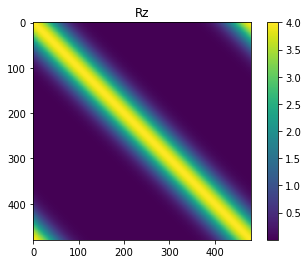

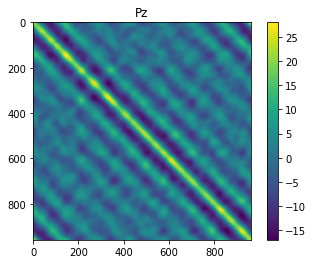

In [282]:
imshow(Rz, 'Rz')
imshow(np.cov(Z0ens), 'Pz')

In [283]:
Nobs = int(Tkf/dt_kf) + 1
t_kf = np.linspace(0, Tkf, Nobs)

Ngt = int(Tgt/dt_gt) + 1
t_gt = np.linspace(0, Tgt, Ngt)
index_Tkf = int(Tkf/dt_gt) + 1

every_t = int(dt_kf/dt_gt)

if not np.allclose(t_kf, t_gt[0:index_Tkf:every_t]):
    print('They do not match')

In [284]:
Zloc = np.arange(Nz)

Zgt_ts = xr.DataArray(Zgt[:, 0:index_Tkf:every_t].copy(),
                      dims=('loc', 'time'),
                      coords={'loc': Zloc,
                              'time': t_kf})
Zobs_ts = Zgt[::everyH, 0:index_Tkf:every_t].copy()
Zobs_ts += np.random.multivariate_normal(np.zeros(Ny), Rz, Zobs_ts.shape[1]).T
Zobs_ts = xr.DataArray(Zobs_ts,
                       dims=('loc', 'time'),
                       coords={'loc': Zloc[::everyH],
                               'time': t_kf})
# this_path = os.path.join(tune_dir, 'Zobs_ts.nc')
# Zobs_ts.to_netcdf(this_path)
# del Zgt

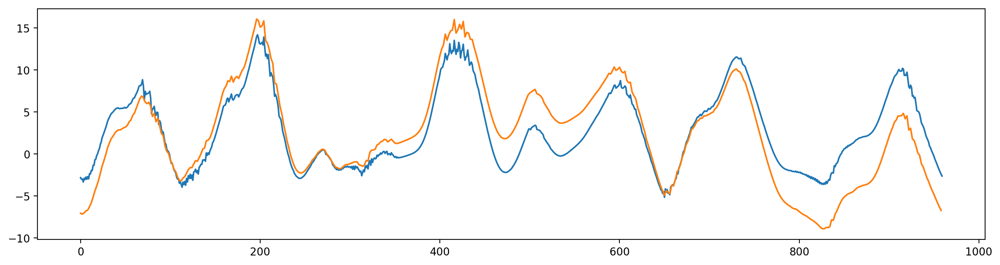

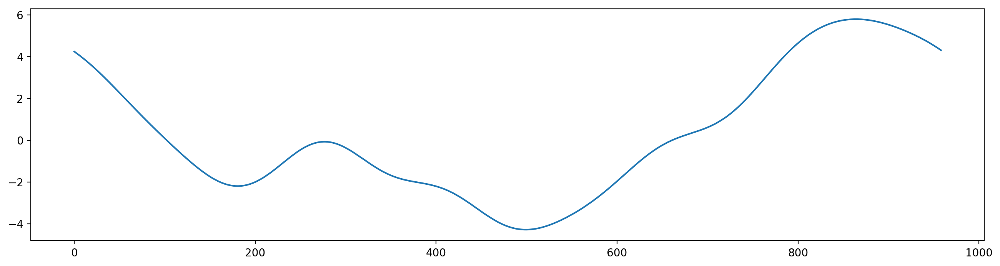

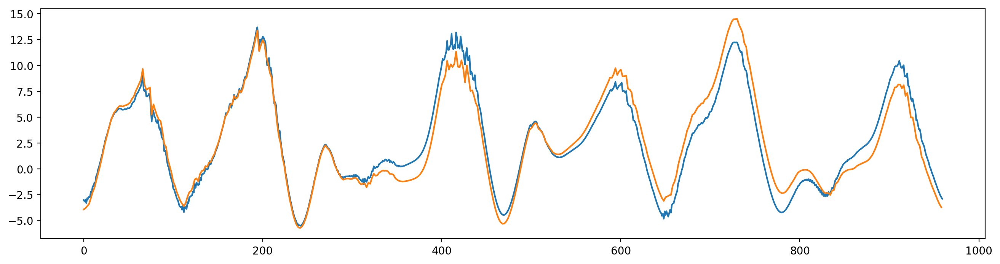

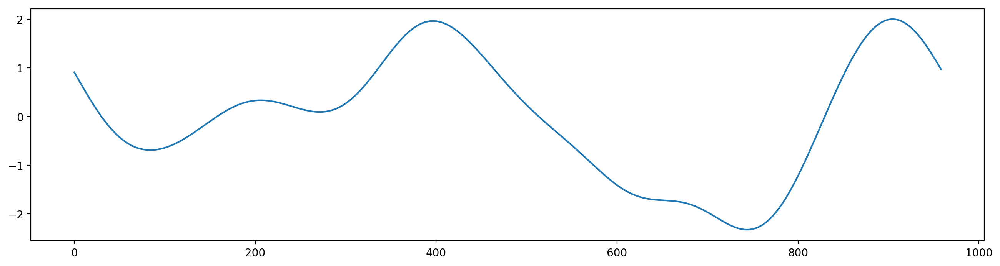

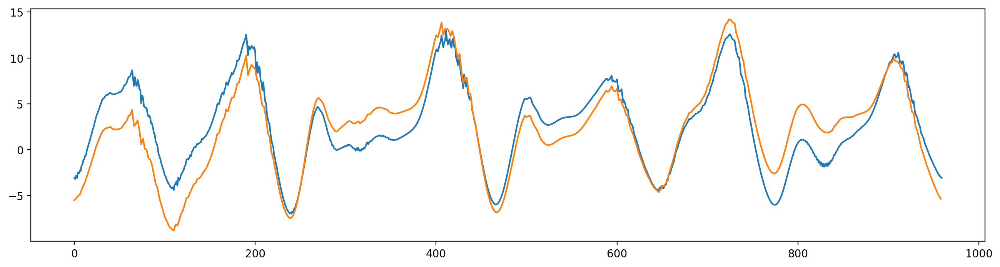

...

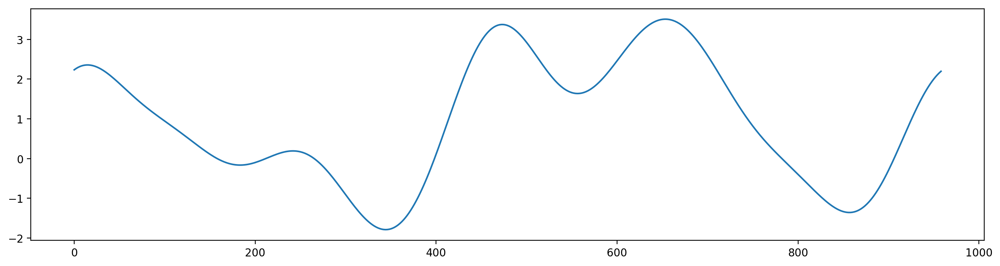

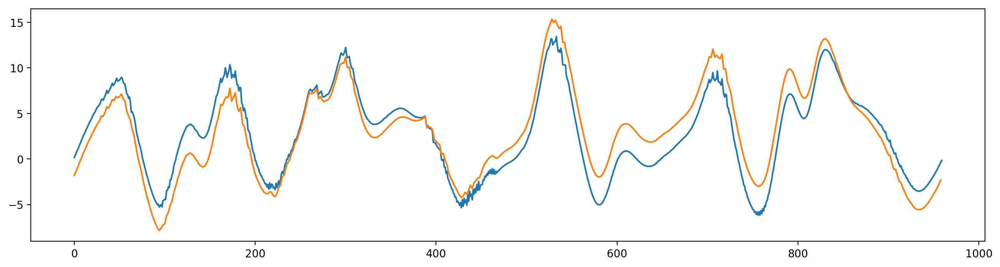

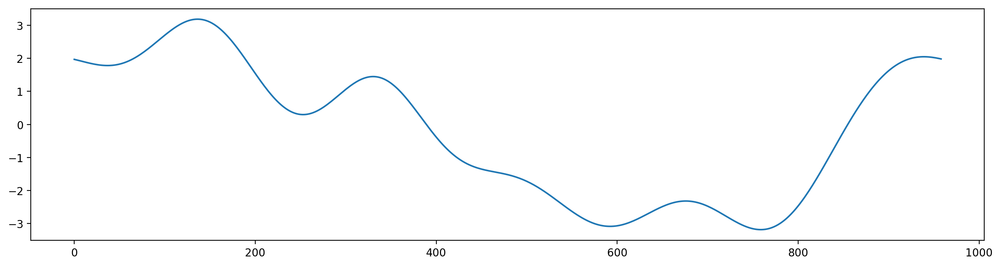

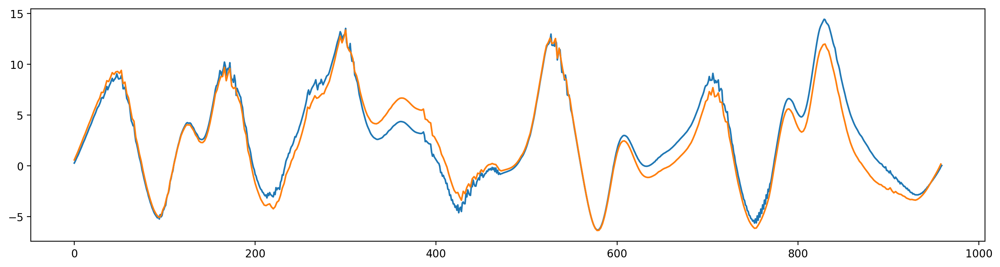

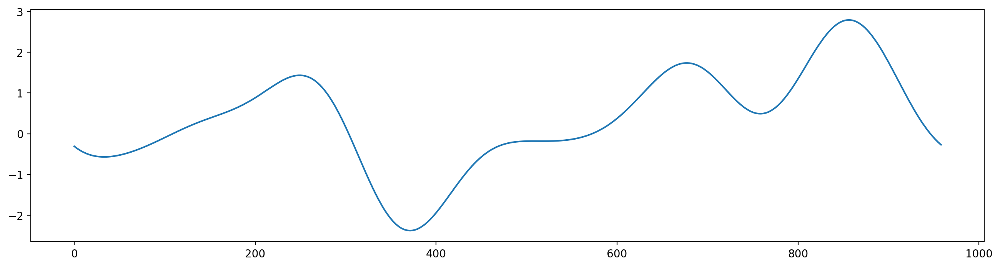

In [285]:
zzObs = np.arange(Nz)[::everyH]
figsize = plt.figaspect(1/4)
dpi=200
for ii in range(10):
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(Zgt_ts.isel(time=ii))
#     plt.scatter(zzObs, Zobs_ts.isel(time=ii), s=5, c='r')
    plt.plot(zzObs, Zobs_ts.isel(time=ii))
    
    this_err = (Zgt_ts.isel(time=ii).values[::everyH]
                - Zobs_ts.isel(time=ii).values)
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(zzObs, this_err)

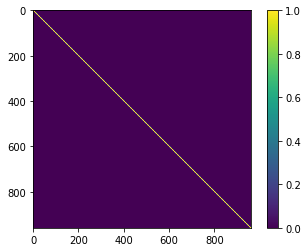

In [286]:
importlib.reload(assimilate)
importlib.reload(utilities)


rmse_array_f = np.ones([alpha_range.size, loc_range.size]) * np.nan
std_array_f = rmse_array_f.copy()

rmse_array_a = rmse_array_f.copy()
std_array_a = rmse_array_f.copy()


this_alpha = 0.08
this_loc = 2

rho_Zc = np.arange(Nz)
rho_Zc = np.minimum(np.abs(Nz - rho_Zc)%Nz, rho_Zc)
rho_Zc = np.exp(-(rho_Zc**2)/(2*this_loc**2))
rho_Zc = sp.linalg.circulant(rho_Zc)
imshow(rho_Zc)

cycle_dict = {'Z0ens': Z0ens,
              'Zobs_ts': Zobs_ts,
              'Rz': Rz, 'Hz': Hz,
              'Tkf': Tkf,
              'dt_kf': dt_kf,
              'dt_rk': dt_trial_rk,
              'rho_Z': rho_Zc,
              'rho0_Z': this_loc,
              'alpha': this_alpha,
              'return_ens': True}
returned_dict = assimilate.cycle_KF_LM3_stdrd(**cycle_dict)

Zens_f_ts = returned_dict['Zens_f_ts']
Zens_a_ts = returned_dict['Zens_a_ts']

In [287]:
mu_f = np.mean(Zens_f_ts, axis=1)
mu_a = np.mean(Zens_a_ts, axis=1)

In [288]:
error_f = mu_f - Zgt_ts[:, 1:]
error_a = mu_a - Zgt_ts[:, 1:]
rmse_f = np.sqrt((error_f**2).mean(axis=0))
rmse_a = np.sqrt((error_a**2).mean(axis=0))

(0, 0.006)

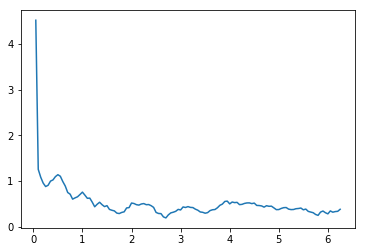

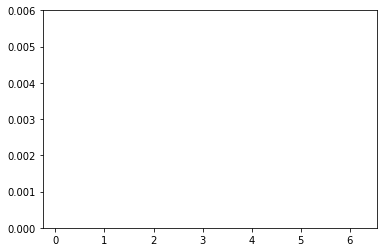

In [289]:
plt.figure()
plt.plot(t_kf[1:], rmse_f)

plt.figure()
plt.plot(t_kf[1:], rmse_f)
plt.ylim([0, 0.006])
# plt.ylim([0, 0.00001])

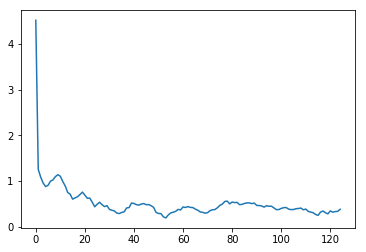

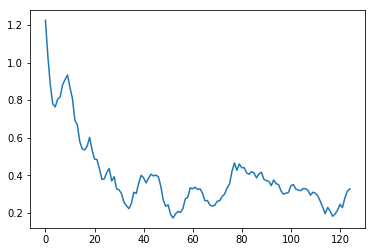

In [290]:
plt.figure()
plt.plot(rmse_f)

plt.figure()
plt.plot(rmse_a)
# plt.ylim([0, 0.00001])

IndexError: index 140 is out of bounds for axis 0 with size 125

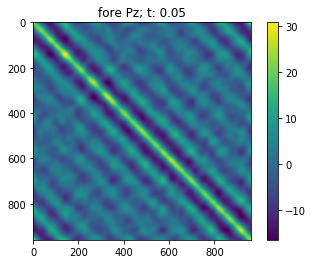

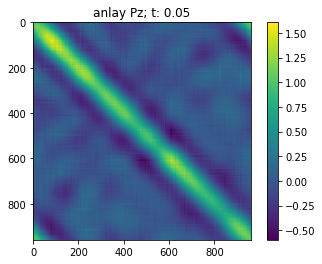

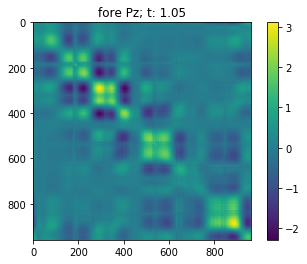

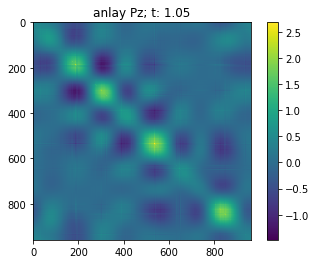

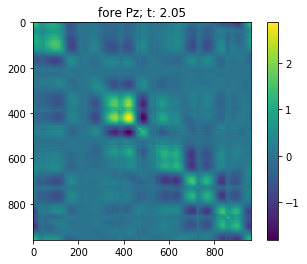

...

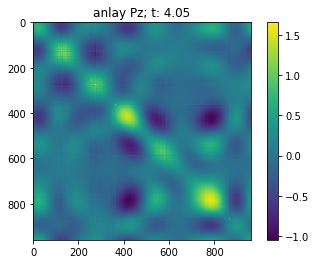

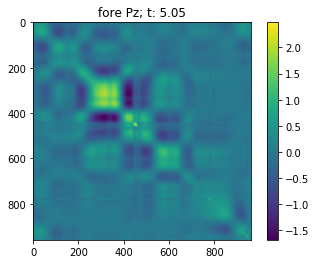

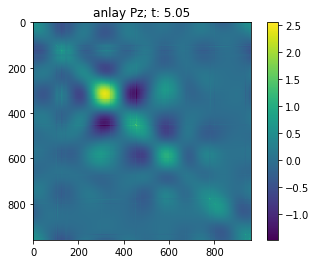

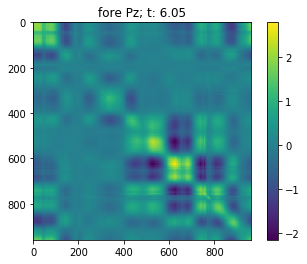

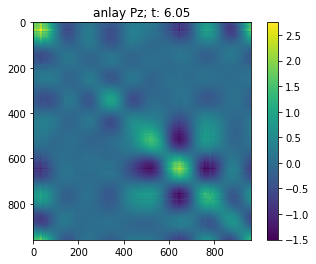

In [291]:
for ii in range(10):
    ii = int(ii/dt_kf)
    t = (ii + 1)*dt_kf
    Pzf = np.cov(Zens_f_ts[:, :, ii])
    imshow(Pzf, f'fore Pz; t: {t:0.3}')
    
    Pza = np.cov(Zens_a_ts[:, :, ii])
    imshow(Pza, f'anlay Pz; t: {t:0.3}')

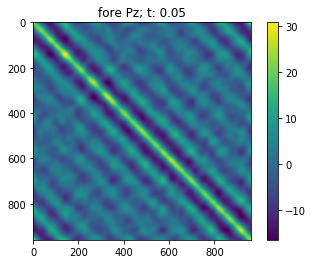

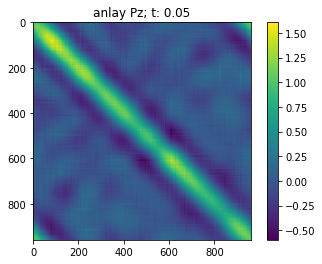

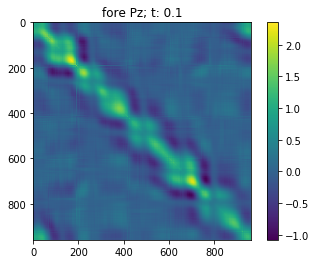

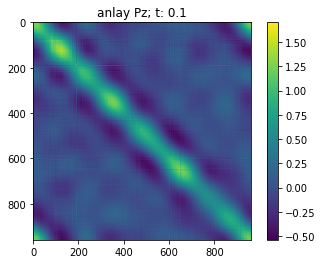

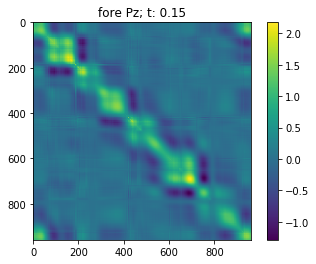

...

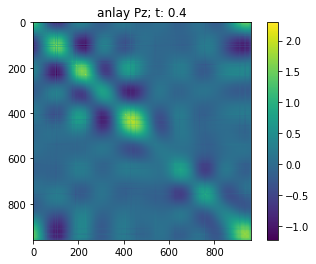

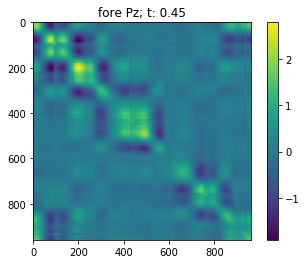

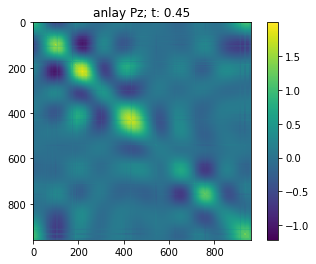

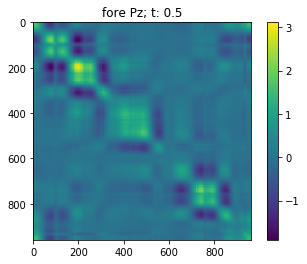

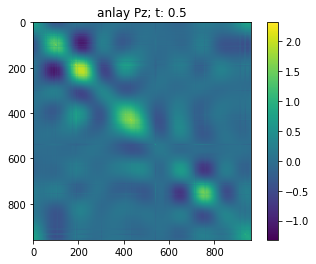

In [292]:
for ii in range(10):
#     ii = int(ii/dt_kf)
    t = (ii + 1)*dt_kf
    Pzf = np.cov(Zens_f_ts[:, :, ii])
    imshow(Pzf, f'fore Pz; t: {t:0.3}')
    
    Pza = np.cov(Zens_a_ts[:, :, ii])
    imshow(Pza, f'anlay Pz; t: {t:0.3}')

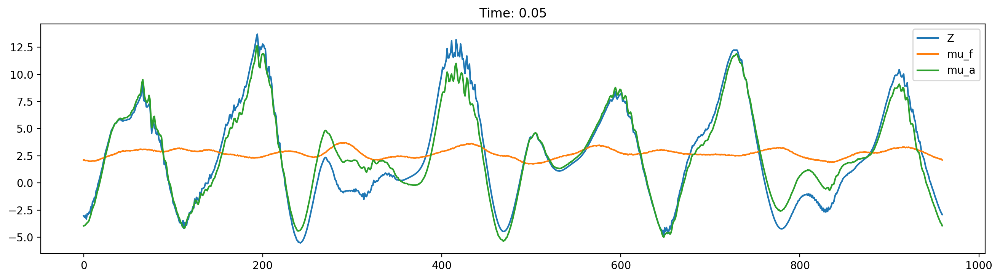

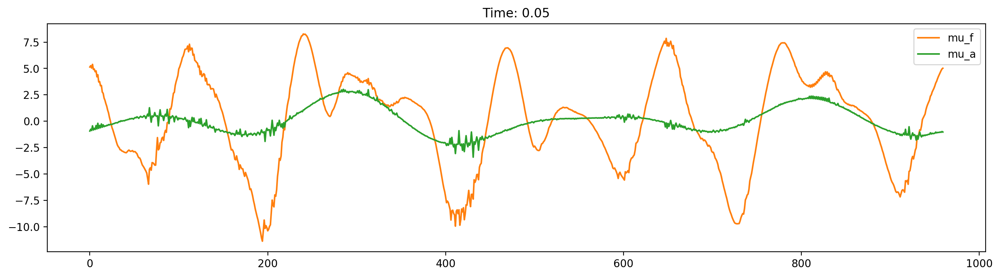

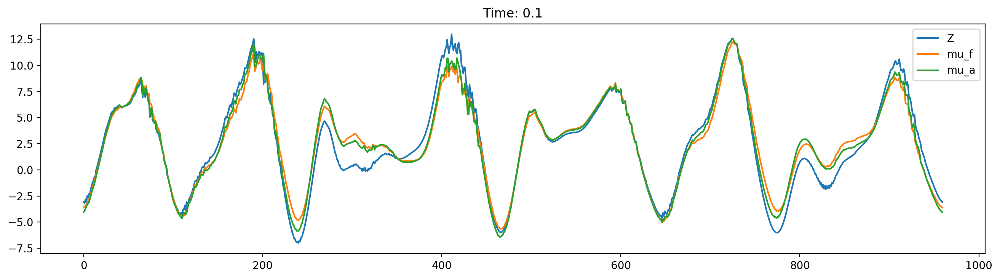

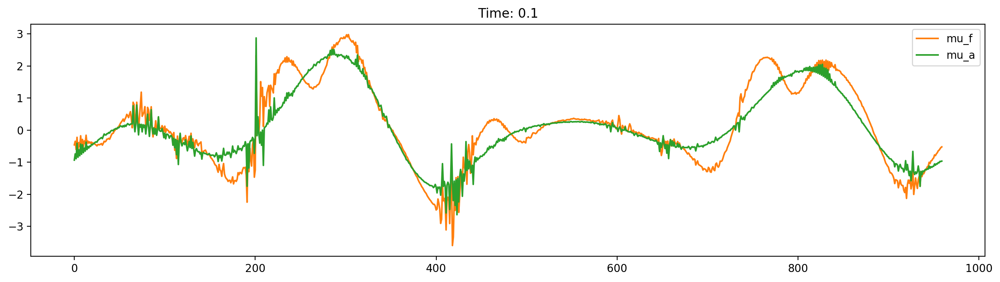

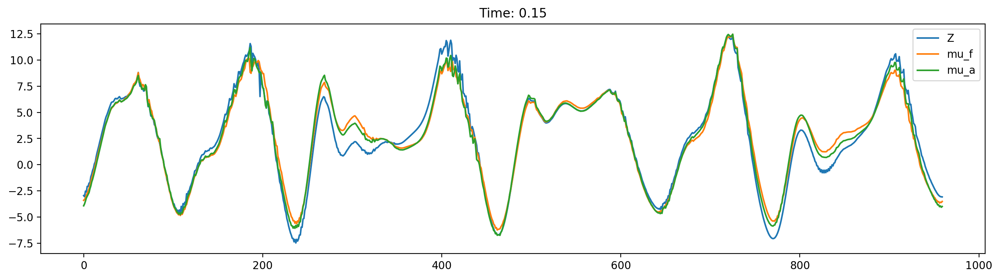

...

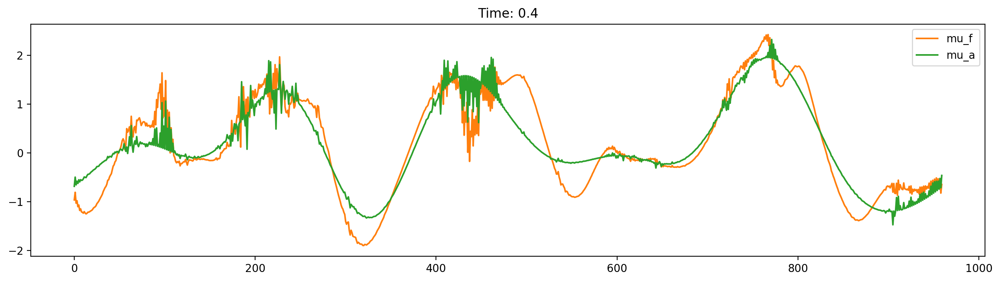

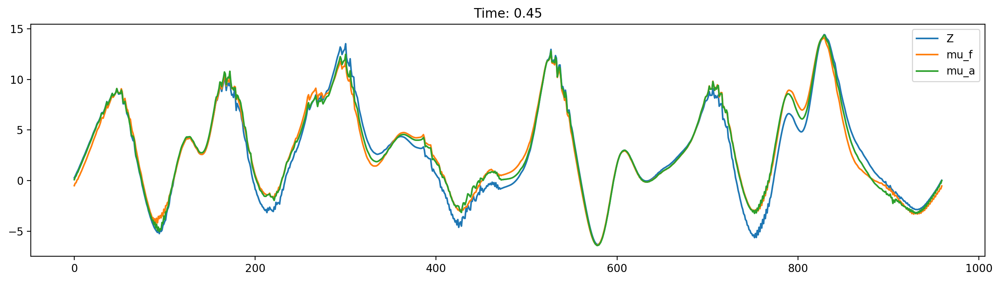

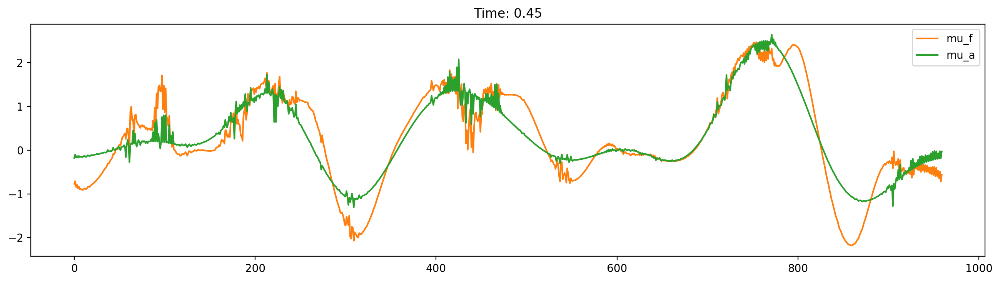

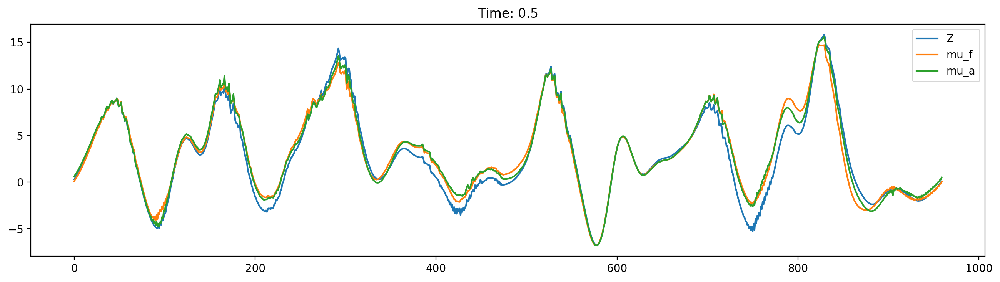

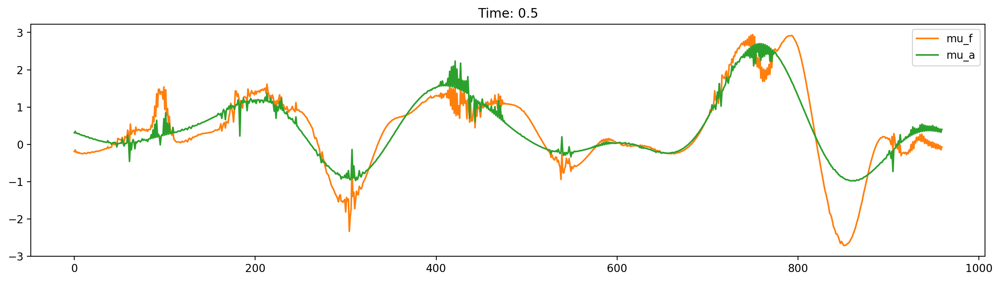

In [293]:
for ii in range(10):
    # ii = int(ii/dt_kf)
    t = t_kf[ii + 1]
    
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(Zgt_ts.isel(time=(ii+1)), color='C0')
    plt.plot(mu_f[:, ii], color='C1')
    plt.plot(mu_a[:, ii], color='C2')
    plt.title(f'Time: {t:0.3}')
    plt.legend(['Z', 'mu_f', 'mu_a'])
    
    plt.figure(figsize=figsize, dpi=dpi)
#     plt.plot(Zgt_ts.isel(time=(ii+1)))
    plt.plot(error_f[:, ii], color='C1')
    plt.plot(error_a[:, ii], color='C2')
    plt.title(f'Time: {t:0.3}')
    plt.legend(['mu_f', 'mu_a'])

In [ ]:
for ii in range(6):
    # ii = int(ii/dt_kf)
    
    t = t_kf[ii + 1]
    
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(Zgt_ts.isel(time=(ii+1)), color='C0')
    plt.plot(zzObs, Zobs_ts.isel(time=ii), color='C3')
    plt.plot(mu_f[:, ii], color='C1')
    plt.plot(mu_a[:, ii], color='C2')
    plt.title(f'Time: {t:0.3}')
    plt.legend(['Z', 'Zobs', 'mu_f', 'mu_a'])
    
    plt.figure(figsize=figsize, dpi=dpi)
#     plt.plot(Zgt_ts.isel(time=(ii+1)))
    plt.plot(error_f[:, ii], color='C1')
    plt.plot(error_a[:, ii], color='C2')
    plt.title(f'Time: {t:0.3}')
    plt.legend(['mu_f', 'mu_a'])

In [ ]:
for ii in range(6):
    # ii = int(ii/dt_kf)
    t = t_kf[ii + 1]
    
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(Zgt_ts.isel(time=(ii+1)), color='C0')
    plt.plot(zzObs, Zobs_ts.isel(time=ii), color='C3')
    plt.plot(Zens_f_ts[:, :, ii], '--', color='C1', alpha=0.25)
    plt.plot(Zens_a_ts[:, :, ii], '--', color='C2', alpha=0.25)
    plt.title(f'Time: {t:0.3}')
    plt.legend(['Z', 'Zobs', 'mu_f', 'mu_a'])
    
#     plt.figure(figsize=figsize, dpi=dpi)
# #     plt.plot(Zgt_ts.isel(time=(ii+1)))
#     plt.plot(error_f[:, ii], color='C1')
#     plt.plot(error_a[:, ii], color='C2')
#     plt.title(f'Time: {t:0.3}')
#     plt.legend(['mu_f', 'mu_a'])

In [ ]:
for ii in range(6):
#     ii = int(ii/dt_kf)
    t = (ii + 1)*dt_kf
    Pzf = np.cov(Zens_f_ts[:, :, ii])
    imshow(Pzf, f'fore Pz; t: {t:0.3}')
    
    Pza = np.cov(Zens_a_ts[:, :, ii])
    imshow(Pza, f'anlay Pz; t: {t:0.3}')

In [ ]:
for ii in range(6):
    # ii = int(ii/dt_kf)
    t = t_kf[ii + 1]
    
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(Zgt_ts.isel(time=(ii+1)), color='C0')
    plt.plot(zzObs, Zobs_ts.isel(time=ii), color='C3')
    plt.plot(mu_f[:, ii], color='C1')
    plt.plot(mu_a[:, ii], color='C2')
    plt.title(f'Time: {t:0.3}')
    plt.legend(['Z', 'Zobs', 'mu_f', 'mu_a'])
    
    plt.figure(figsize=figsize, dpi=dpi)
#     plt.plot(Zgt_ts.isel(time=(ii+1)))
    plt.plot(error_f[:, ii], color='C1')
    plt.plot(error_a[:, ii], color='C2')
    plt.title(f'Time: {t:0.3}')
    plt.legend(['mu_f', 'mu_a'])

In [ ]:
for ii in range(6):
    # ii = int(ii/dt_kf)
    t = t_kf[ii + 1]
    
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(Zgt_ts.isel(time=(ii+1)), color='C0')
    plt.plot(zzObs, Zobs_ts.isel(time=ii), color='C3')
    plt.plot(Zens_f_ts[:, :, ii], '--', color='C1', alpha=0.25)
    plt.plot(Zens_a_ts[:, :, ii], '--', color='C2', alpha=0.25)
    plt.title(f'Time: {t:0.3}')
    plt.legend(['Z', 'Zobs', 'mu_f', 'mu_a'])
    
#     plt.figure(figsize=figsize, dpi=dpi)
# #     plt.plot(Zgt_ts.isel(time=(ii+1)))
#     plt.plot(error_f[:, ii], color='C1')
#     plt.plot(error_a[:, ii], color='C2')
#     plt.title(f'Time: {t:0.3}')
#     plt.legend(['mu_f', 'mu_a'])

In [ ]:
for ii in range(6):
#     ii = int(ii/dt_kf)
    t = (ii + 1)*dt_kf
    Pzf = np.cov(Zens_f_ts[:, :, ii])
    imshow(Pzf, f'fore Pz; t: {t:0.3}')
    
    Pza = np.cov(Zens_a_ts[:, :, ii])
    imshow(Pza, f'anlay Pz; t: {t:0.3}')